<div style="padding: 20px;
            background-color: #2575fc;
            font-family: Arial, sans-serif;
            color: #ffffff;
            font-size: 300%;
            text-align: center;
            border-radius: 20px 0px;
            box-shadow: 0 4px 15px rgba(0, 0, 0, 0.2);">
 Text Extraction with PaddleOCR 🔎💊 
</div>

<div style="font-family: Arial, sans-serif;
            color: #000000;
            font-size: 175%;
            text-align: center;
            margin-top: 20px;">

</div>

<div style="padding: 10px;
            background-color: #f0f0f0;
            font-family: Arial, sans-serif;
            color: #333333;
            font-size: 120%;
            text-align: center;
            border-radius: 10px;
            box-shadow: 0 2px 8px rgba(0, 0, 0, 0.1);
            margin-top: 10px;
            opacity: 0.9;">
📊 Data Understanding
</div>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os


In [ ]:
from tabulate import tabulate


In [ ]:
# Spécifie le chemin exact du dossier "image_numérique"
image_folder_path = '/content/drive/My Drive/image_numérique/'

# Lister les fichiers du dossier
image_files = os.listdir(image_folder_path)
image_files = [f for f in image_files if f.endswith(('jpg', 'jpeg', 'png', 'bmp'))]

# Afficher les 5 premières images pour confirmation
print(f"Liste des images dans le dossier :\n" + "\n".join(image_files))


Liste des images dans le dossier :
13198--8882544--20231122_page_7.jpg
5267--9523449--20230914_page_2.jpg
13198--8882544--20231122_page_9.jpg
13198--8882544--20231122_page_10.jpg
2900--Mle 98249  Bs 9007455--20231026_page_2.jpg
13198--8882544--20231122_page_3.jpg
13198--8882544--20231122_page_5.jpg
13198--8882544--20231122_page_8.jpg
2900--Mle 98249  Bs 9007455--20231026_page_0.jpg
2901--Mle 65023  BS 7059106--20231026_page_2.jpg
5268--8967353--20230914_page_2.jpg
13199--9523436--20231122_page_3.jpg
2903--Mle 76069  --20231026_page_0.jpg
2904--Mle 67032--20231026_page_0.jpg
5268--8967962--20230914_page_2.jpg
13200--9402622--20231122_page_3.jpg
5269--8967354--20230914_page_2.jpg
2905--Mle 80161--20231026_page_2.jpg
13201--9402623--20231122_page_4.jpg
13201--9402623--20231122_page_7.jpg
5269--9271977--20230914_page_2.jpg
13201--9402623--20231122_page_5.jpg
2907--Mle 63014--20231026_page_2.jpg
13201--9402623--20231122_page_3.jpg
13201--9402623--20231122_page_8.jpg
13201--9402623--20231122

In [ ]:
num_images = len(image_files)
print(f"Nombre total d'images : {num_images}")

Nombre total d'images : 1760


In [ ]:
from collections import Counter

# Compter les types de fichiers
file_extensions = [f.split('.')[-1].lower() for f in image_files if '.' in f]
extension_counts = Counter(file_extensions)
print(extension_counts)

Counter({'jpg': 1736, 'png': 24})


In [ ]:
# Préparer les données pour le plot
extensions = list(extension_counts.keys())
counts = list(extension_counts.values())



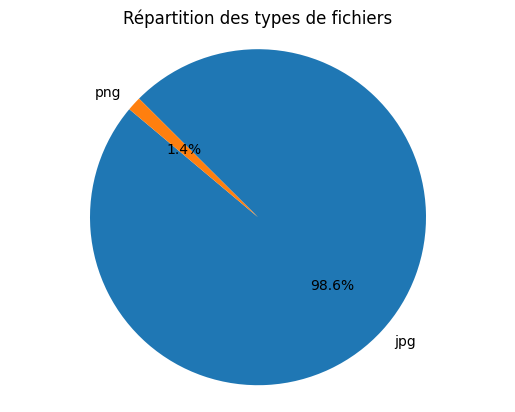

In [ ]:
plt.pie(counts, labels=extensions, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Assure que le cercle est parfait
plt.title('Répartition des types de fichiers')
plt.show()

Largeur minimale : 720, Largeur maximale : 3618
Hauteur minimale : 574, Hauteur maximale : 3717
Largeur moyenne : 2074.30, Hauteur moyenne : 2414.90


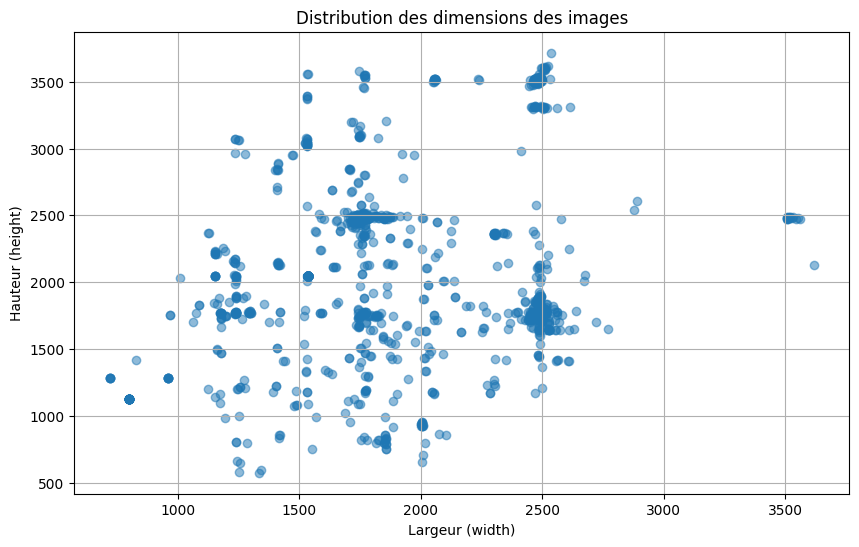

In [ ]:
# Fonction pour obtenir les dimensions d'une image
def get_image_dimensions(image_file):
    image_path = os.path.join(image_folder_path, image_file)
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    if image is not None:
        height, width = image.shape[:2]
        return width, height
    return None

# Utiliser le multiprocessing pour accélérer la lecture des images
with Pool() as pool:
    image_dimensions = pool.map(get_image_dimensions, image_files)

# Filtrer les valeurs None (images non lues)
image_dimensions = [dim for dim in image_dimensions if dim is not None]

# Afficher les dimensions minimales, maximales et moyennes
widths = [dim[0] for dim in image_dimensions]
heights = [dim[1] for dim in image_dimensions]

print(f"Largeur minimale : {min(widths)}, Largeur maximale : {max(widths)}")
print(f"Hauteur minimale : {min(heights)}, Hauteur maximale : {max(heights)}")
print(f"Largeur moyenne : {sum(widths) / len(widths):.2f}, Hauteur moyenne : {sum(heights) / len(heights):.2f}")

# Tracer les dimensions des images
plt.figure(figsize=(10, 6))
plt.scatter(widths, heights, alpha=0.5)
plt.title('Distribution des dimensions des images')
plt.xlabel('Largeur (width)')
plt.ylabel('Hauteur (height)')
plt.grid(True)
plt.show()

La majorité des images sont au format JPG (992 images), et quelques-unes sont au format PNG (24 images)

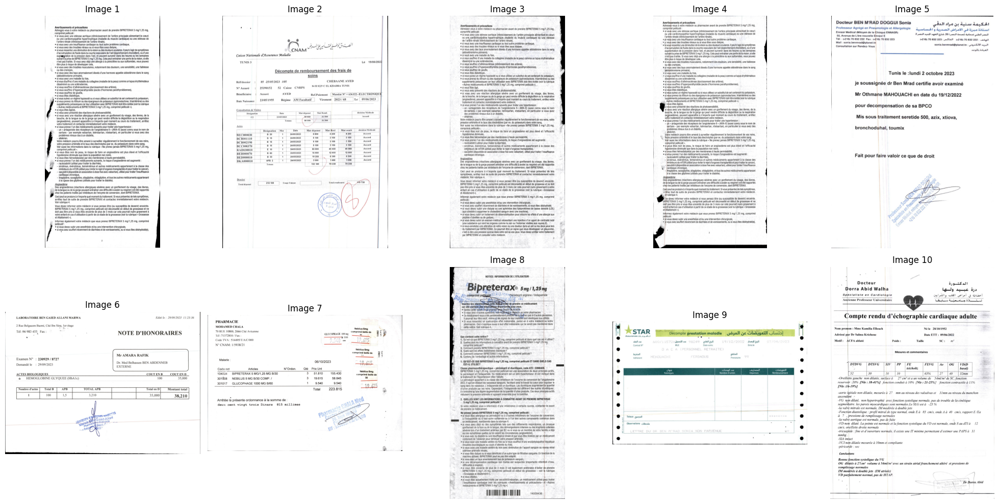

In [ ]:
import matplotlib.pyplot as plt

# Nombre d'images à afficher
num_images_to_display = 10  # Changez ce nombre selon vos besoins

# Afficher les premières images
plt.figure(figsize=(20, 10))  # Ajuster la taille de la figure pour plus d'images
for i, image_file in enumerate(image_files[:num_images_to_display]):
    image_path = os.path.join(image_folder_path, image_file)
    image = cv2.imread(image_path)
    if image is not None:  # Vérifier si l'image est lue correctement
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convertir en RGB pour l'affichage
        plt.subplot(2, 5, i + 1)  # Ajuster la disposition des sous-graphiques (2 lignes, 5 colonnes)
        plt.imshow(image)
        plt.title(f"Image {i + 1}")
        plt.axis('off')
    else:
        print(f"Erreur : Impossible de lire l'image {image_file}")
plt.tight_layout()  # Ajuster l'espacement entre les images
plt.show()

Total B: [3997312.]
Total G: [3997312.]
Total R: [3997312.]


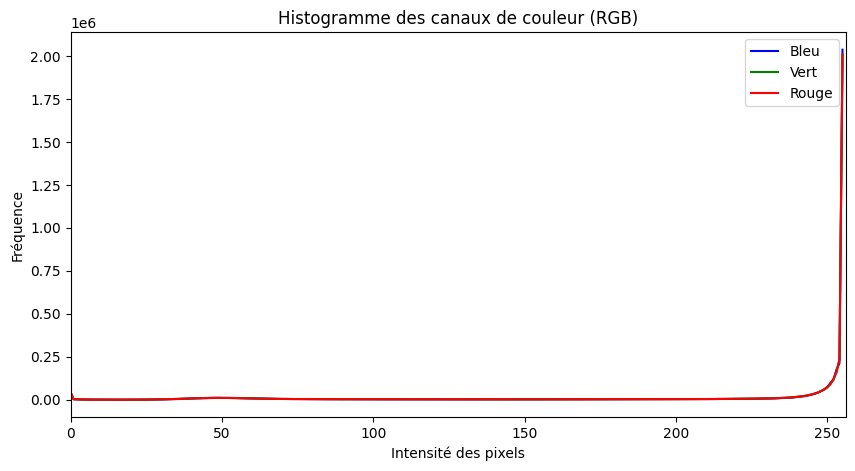

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Lire l'image en couleur
image_path = os.path.join(image_folder_path, image_files[0])
image = cv2.imread(image_path)

# Séparer les canaux de couleur
colors = ('b', 'g', 'r')
plt.figure(figsize=(10, 5))
for i, color in enumerate(colors):
    histogram = cv2.calcHist([image], [i], None, [256], [0, 256])
    plt.plot(histogram, color=color)
    plt.xlim([0, 256])

    # Calculer la somme des valeurs de l'histogramme pour chaque canal
    total = sum(histogram)
    print(f"Total {color.upper()}: {total}")

plt.title("Histogramme des canaux de couleur (RGB)")
plt.xlabel("Intensité des pixels")
plt.ylabel("Fréquence")
plt.legend(['Bleu', 'Vert', 'Rouge'])
plt.show()

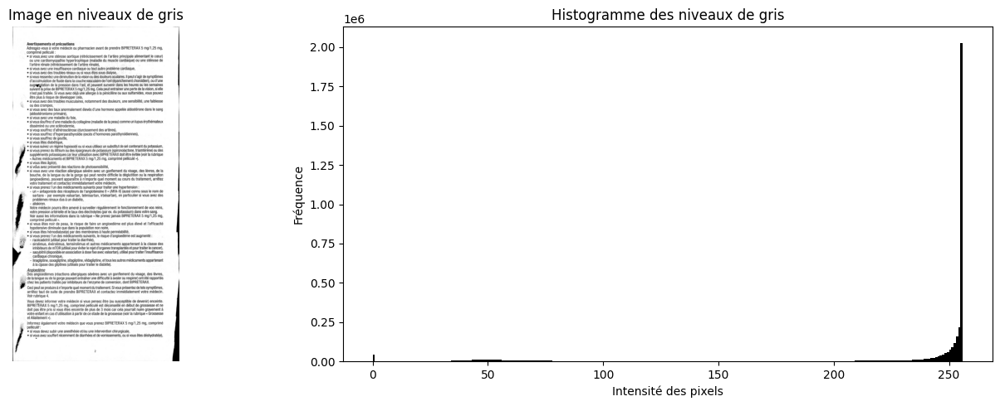

In [ ]:
# Lire l'image en niveaux de gris
image_path = os.path.join(image_folder_path, image_files[0])
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Afficher l'image et son histogramme
plt.figure(figsize=(15, 5))

# Afficher l'image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Image en niveaux de gris")
plt.axis('off')

# Afficher l'histogramme
plt.subplot(1, 2, 2)
plt.hist(image.ravel(), bins=256, range=(0, 256), color='black')
plt.title("Histogramme des niveaux de gris")
plt.xlabel("Intensité des pixels")
plt.ylabel("Fréquence")

plt.tight_layout()
plt.show()

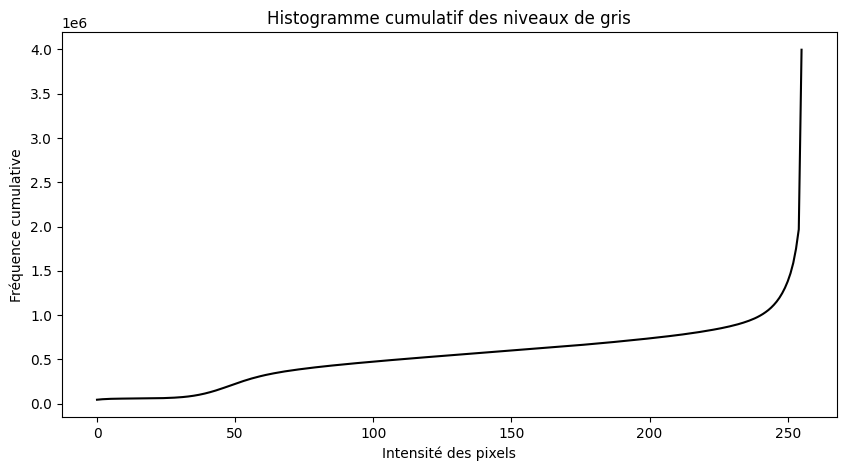

In [ ]:
# Calculer l'histogramme cumulatif
histogram = cv2.calcHist([image], [0], None, [256], [0, 256])
cumulative_histogram = histogram.cumsum()

# Afficher l'histogramme cumulatif
plt.figure(figsize=(10, 5))
plt.plot(cumulative_histogram, color='black')
plt.title("Histogramme cumulatif des niveaux de gris")
plt.xlabel("Intensité des pixels")
plt.ylabel("Fréquence cumulative")
plt.show()

In [ ]:
# Vérifier les images corrompues
corrupted_images = []

for image_file in image_files:
    image_path = os.path.join(image_folder_path, image_file)
    image = cv2.imread(image_path)
    if image is None:
        corrupted_images.append(image_file)

if corrupted_images:
    print(f"Images corrompues détectées : {corrupted_images}")
else:
    print("Aucune image corrompue détectée.")

Aucune image corrompue détectée.


In [ ]:
import numpy as np

# Vérifier si une image est en noir et blanc (binaire)
def is_binary(image):
    unique_values = np.unique(image)  # Obtenir les valeurs uniques des pixels
    return set(unique_values).issubset({0, 255})  # Vérifier si seuls 0 et 255 sont présents

# Exemple d'utilisation
binary_images = []

for image_file in image_files:
    image_path = os.path.join(image_folder_path, image_file)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Charger en niveaux de gris
    if is_binary(image):  # Vérifier si l'image est binaire
        binary_images.append(image_file)

if binary_images:
    print(f"Images en noir et blanc détectées : {len(binary_images)}")
    print(f"Exemples d'images en noir et blanc : {binary_images[:5]}")
else:
    print("Aucune image en noir et blanc détectée.")

Aucune image en noir et blanc détectée.


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Vérifier les images en niveaux de gris
gray_images = []

for image_file in image_files:
    image_path = os.path.join(image_folder_path, image_file)
    image = cv2.imread(image_path)

    # Vérifier si l'image est lue correctement
    if image is None:
        print(f"Erreur : Impossible de lire l'image {image_file}")
        continue

    # Vérifier si l'image est en niveaux de gris
    if len(image.shape) == 2:  # Image en niveaux de gris
        gray_images.append(image_file)

# Afficher les résultats
if gray_images:
    print(f"Images en niveaux de gris détectées : {len(gray_images)}/{len(image_files)}")
    print(f"Liste des images en niveaux de gris : {gray_images}")

    # Afficher un échantillon des images en niveaux de gris
    num_samples = min(3, len(gray_images))  # Afficher jusqu'à 3 images
    plt.figure(figsize=(15, 5))
    for i, gray_image_file in enumerate(gray_images[:num_samples]):
        image_path = os.path.join(image_folder_path, gray_image_file)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        plt.subplot(1, num_samples, i + 1)
        plt.imshow(image, cmap='gray')
        plt.title(f"Image en niveaux de gris : {gray_image_file}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Toutes les images sont en couleur.")

Toutes les images sont en couleur.


In [ ]:
import os
from PIL import Image
import numpy as np

# Analyser la taille des fichiers et la résolution
file_sizes = []  # Taille des fichiers en octets
resolutions = []  # Résolutions en DPI

for image_file in image_files:
    image_path = os.path.join(image_folder_path, image_file)
    try:
        with Image.open(image_path) as img:
            file_sizes.append(os.path.getsize(image_path))  # Taille en octets
            resolutions.append(img.info.get('dpi', (None, None)))  # Résolution en DPI
    except Exception as e:
        print(f"Erreur : Impossible de lire l'image {image_file} : {e}")

# Convertir les tailles en Ko pour une meilleure lisibilité
file_sizes_kb = [size / 1024 for size in file_sizes]

# Afficher les résultats
if file_sizes:
    print(f"Taille minimale des fichiers : {min(file_sizes_kb):.2f} Ko")
    print(f"Taille maximale des fichiers : {max(file_sizes_kb):.2f} Ko")
    print(f"Taille moyenne des fichiers : {np.mean(file_sizes_kb):.2f} Ko")
    print(f"Taille médiane des fichiers : {np.median(file_sizes_kb):.2f} Ko")
else:
    print("Aucune taille de fichier disponible.")

if resolutions:
    # Filtrer les résolutions valides (supprimer les valeurs None)
    valid_resolutions = [res for res in resolutions if res != (None, None)]
    if valid_resolutions:
        print(f"Résolution la plus courante : {max(set(valid_resolutions), key=valid_resolutions.count)}")
        print(f"Résolutions trouvées : {set(valid_resolutions)}")
    else:
        print("Aucune résolution valide trouvée.")
else:
    print("Aucune résolution disponible.")

Taille minimale des fichiers : 15.50 Ko
Taille maximale des fichiers : 1608.96 Ko
Taille moyenne des fichiers : 387.89 Ko
Taille médiane des fichiers : 355.96 Ko
Aucune résolution valide trouvée.


In [ ]:
import cv2

# Fonction pour identifier le format des couleurs
def get_color_format(image):
    num_channels = image.shape[-1]
    if num_channels == 1:
        return "Niveaux de gris"
    elif num_channels == 3:
        return "BGR (Couleur, 3 canaux)"
    elif num_channels == 4:
        return "RGBA (Couleur avec transparence, 4 canaux)"
    else:
        return f"Format inconnu ({num_channels} canaux)"

# Vérifier le format des couleurs pour chaque image
for image_file in image_files[:10]:  # Analyser les 5 premières images
    image_path = os.path.join(image_folder_path, image_file)
    image = cv2.imread(image_path)

    if image is not None:
        print(f"Image : {image_file}")
        print(f"Taille de l'image : {image.shape[1]}x{image.shape[0]}")  # Largeur x Hauteur
        print(f"Type de données : {image.dtype}")
        print(f"Format des couleurs : {get_color_format(image)}")
        print("-" * 40)
    else:
        print(f"Erreur : Impossible de lire l'image {image_file}")

Image : 13198--8882544--20231122_page_7.jpg
Taille de l'image : 1408x2839
Type de données : uint8
Format des couleurs : BGR (Couleur, 3 canaux)
----------------------------------------
Image : 5267--9523449--20230914_page_2.jpg
Taille de l'image : 2498x3505
Type de données : uint8
Format des couleurs : BGR (Couleur, 3 canaux)
----------------------------------------
Image : 13198--8882544--20231122_page_9.jpg
Taille de l'image : 1411x2842
Type de données : uint8
Format des couleurs : BGR (Couleur, 3 canaux)
----------------------------------------
Image : 13198--8882544--20231122_page_10.jpg
Taille de l'image : 1412x2888
Type de données : uint8
Format des couleurs : BGR (Couleur, 3 canaux)
----------------------------------------
Image : 2900--Mle 98249  Bs 9007455--20231026_page_2.jpg
Taille de l'image : 1735x2488
Type de données : uint8
Format des couleurs : BGR (Couleur, 3 canaux)
----------------------------------------
Image : 13198--8882544--20231122_page_3.jpg
Taille de l'image 

<div style="padding: 10px;
            background-color: #f0f0f0;
            font-family: Arial, sans-serif;
            color: #333333;
            font-size: 120%;
            text-align: center;
            border-radius: 10px;
            box-shadow: 0 2px 8px rgba(0, 0, 0, 0.1);
            margin-top: 10px;
            opacity: 0.9;">
🛠️ Data Preparation
</div>

Image : 13198--8882544--20231122_page_7.jpg, Angle d'inclinaison détecté : 0.00°
Image : 5267--9523449--20230914_page_2.jpg, Angle d'inclinaison détecté : 0.00°
Image : 13198--8882544--20231122_page_9.jpg, Angle d'inclinaison détecté : -90.00°
Image : 13198--8882544--20231122_page_10.jpg, Angle d'inclinaison détecté : 0.00°
Image : 2900--Mle 98249  Bs 9007455--20231026_page_2.jpg, Angle d'inclinaison détecté : -90.00°


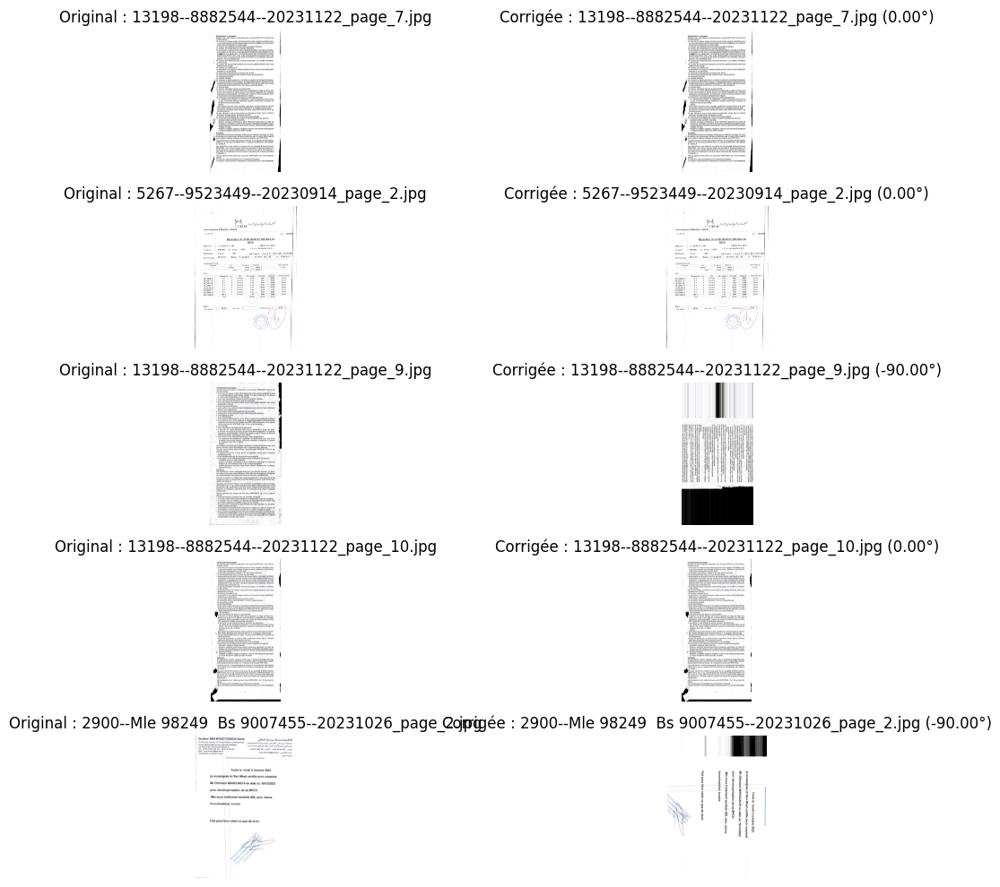

In [ ]:
import cv2
import numpy as np

def get_skew_angle(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.bitwise_not(img)  # Inverser les couleurs pour détecter les contours

    coords = np.column_stack(np.where(img > 0))
    angle = cv2.minAreaRect(coords)[-1]

    if angle < -45:
        angle = -(90 + angle)
    else:
        angle = -angle

    return angle

# Tester sur quelques images
for image_file in image_files[:5]:  # Analyser les 5 premières images
    image_path = os.path.join(image_folder_path, image_file)
    angle = get_skew_angle(image_path)
    print(f"Image : {image_file}, Angle d'inclinaison détecté : {angle:.2f}°")

In [ ]:
def correct_skew(image_path, angle):
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Erreur : Impossible de lire l'image {image_path}")

    (h, w) = img.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated

def preprocess_image(image):
    # Conversion en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Débruitage (flou gaussien)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Seuillage (binarisation)
    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    return thresh

In [ ]:
for image_file in image_files[:50]:  # Analyser les 5 premières images
    image_path = os.path.join(image_folder_path, image_file)
    try:
        # Détecter l'angle d'inclinaison
        angle = get_skew_angle(image_path)
        print(f"Image : {image_file}, Angle d'inclinaison détecté : {angle:.2f}°")

        # Corriger l'inclinaison
        corrected_img = correct_skew(image_path, angle)

        # Appliquer le prétraitement
        preprocessed_img = preprocess_image(corrected_img)

        # Enregistrer l'image prétraitée
        output_path = os.path.join(image_folder_path, "pretraitee_" + image_file)
        cv2.imwrite(output_path, preprocessed_img)
        print(f"Image prétraitée enregistrée : {output_path}")

    except Exception as e:
        print(f"Erreur lors du traitement de l'image {image_file} : {e}")

Image : 13198--8882544--20231122_page_7.jpg, Angle d'inclinaison détecté : 0.00°
Image prétraitée enregistrée : /content/drive/My Drive/image_numérique/pretraitee_13198--8882544--20231122_page_7.jpg
Image : 5267--9523449--20230914_page_2.jpg, Angle d'inclinaison détecté : 0.00°
Image prétraitée enregistrée : /content/drive/My Drive/image_numérique/pretraitee_5267--9523449--20230914_page_2.jpg
Image : 13198--8882544--20231122_page_9.jpg, Angle d'inclinaison détecté : -90.00°
Image prétraitée enregistrée : /content/drive/My Drive/image_numérique/pretraitee_13198--8882544--20231122_page_9.jpg
Image : 13198--8882544--20231122_page_10.jpg, Angle d'inclinaison détecté : 0.00°
Image prétraitée enregistrée : /content/drive/My Drive/image_numérique/pretraitee_13198--8882544--20231122_page_10.jpg
Image : 2900--Mle 98249  Bs 9007455--20231026_page_2.jpg, Angle d'inclinaison détecté : -90.00°
Image prétraitée enregistrée : /content/drive/My Drive/image_numérique/pretraitee_2900--Mle 98249  Bs

Pour chaque image analysée :

L'angle d'inclinaison est détecté et affiché.

L'image est redressée et prétraitée.

L'image prétraitée est enregistrée pour une utilisation ultérieure

<div style="padding: 10px;
            background-color: #f0f0f0;
            font-family: Arial, sans-serif;
            color: #333333;
            font-size: 120%;
            text-align: center;
            border-radius: 10px;
            box-shadow: 0 2px 8px rgba(0, 0, 0, 0.1);
            margin-top: 10px;
            opacity: 0.9;">
📂 Model Setup


</div>

In [ ]:
!python -m pip install paddlepaddle-gpu -i https://pypi.org/simple


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 759.0/759.0 MB 568.8 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 3.8 MB/s eta 0:00:00
  Attempting uninstall: opt-einsum
    Found existing installation: opt_einsum 3.4.0
    Uninstalling opt_einsum-3.4.0:
      Successfully uninstalled opt_einsum-3.4.0


In [ ]:
!pip install paddleocr


In [ ]:
!git clone https://github.com/PaddlePaddle/PaddleOCR


Cloning into 'PaddleOCR'...
remote: Enumerating objects: 126732, done.
remote: Counting objects: 100% (8308/8308), done.
remote: Compressing objects: 100% (925/925), done.
remote: Total 126732 (delta 7907), reused 7545 (delta 7383), pack-reused 118424 (from 3)
Receiving objects: 100% (126732/126732), 760.32 MiB | 20.21 MiB/s, done.
Resolving deltas: 100% (98264/98264), done.
Updating files: 100% (2028/2028), done.


In [ ]:
from paddleocr import PaddleOCR, draw_ocr


In [ ]:
ocr_model = PaddleOCR(lang='en')


download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer/en_PP-OCRv3_det_infer.tar


100%|██████████| 3910/3910 [00:16<00:00, 238.29it/s] 


download https://paddleocr.bj.bcebos.com/PP-OCRv4/english/en_PP-OCRv4_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer/en_PP-OCRv4_rec_infer.tar


100%|██████████| 10000/10000 [00:19<00:00, 504.40it/s]


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2138/2138 [00:14<00:00, 143.35it/s]

[2025/03/08 15:16:55] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, use_gcu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_l

In [ ]:
path='/content/drive/My Drive/image_numérique/pretraitee_5268--8967353--20230914_page_2.jpg'

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

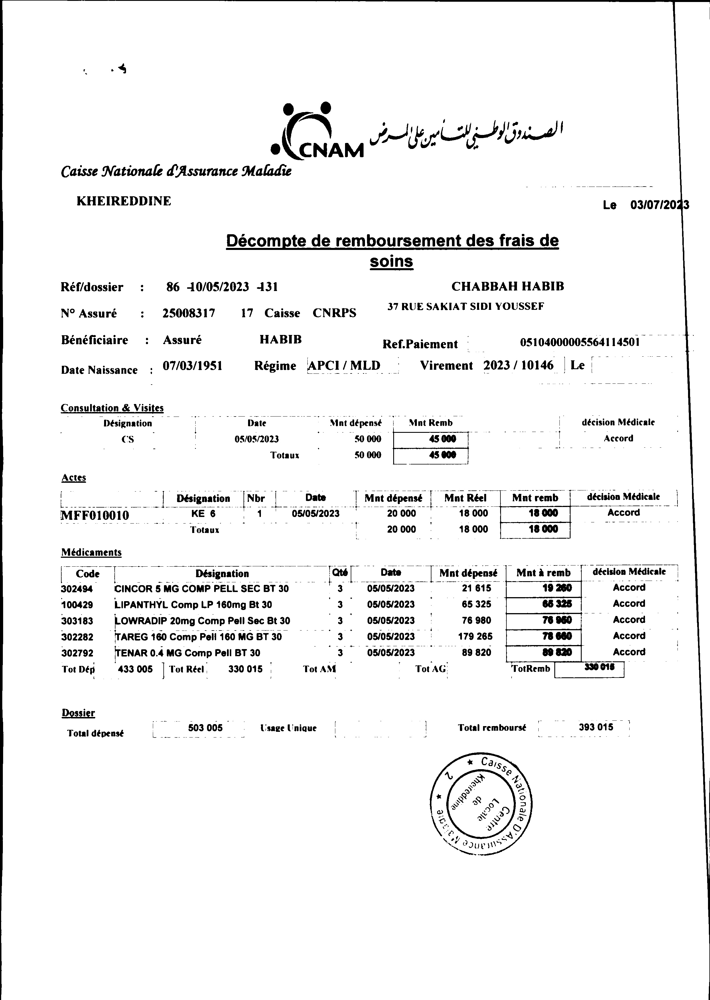

In [ ]:
img = cv2.imread(path)

# Vérifier si l'image a été chargée correctement
if img is None:
    print("Erreur : Impossible de charger l'image. Vérifiez le chemin.")
else:
    # Afficher l'image
    cv2_imshow(img)

<div style="padding: 10px;
            background-color: #f0f0f0;
            font-family: Arial, sans-serif;
            color: #333333;
            font-size: 120%;
            text-align: center;
            border-radius: 10px;
            box-shadow: 0 2px 8px rgba(0, 0, 0, 0.1);
            margin-top: 10px;
            opacity: 0.9;">
🔎 Text Extraction Process



</div>

In [ ]:
result = ocr_model.ocr(path)


[2025/03/08 15:17:55] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2025/03/08 15:17:56] ppocr DEBUG: dt_boxes num : 112, elapsed : 1.068239450454712
[2025/03/08 15:18:12] ppocr DEBUG: rec_res num  : 112, elapsed : 15.303725957870483


In [ ]:
result


[[[[[1104.0, 504.0], [1249.0, 504.0], [1249.0, 544.0], [1104.0, 544.0]],
   ('NAN', 0.9334477782249451)],
  [[[215.0, 573.0], [1026.0, 573.0], [1026.0, 624.0], [215.0, 624.0]],
   ("Caisse Nationale d'Assurance Maladie", 0.9889233112335205)],
  [[[263.0, 679.0], [604.0, 679.0], [604.0, 727.0], [263.0, 727.0]],
   ('KHEIREDDINE', 0.9977115392684937)],
  [[[2105.0, 690.0], [2420.0, 690.0], [2420.0, 741.0], [2105.0, 741.0]],
   ('Le  03/07/2023', 0.9494885802268982)],
  [[[797.0, 818.0], [1956.0, 818.0], [1956.0, 869.0], [797.0, 869.0]],
   ('Decompte de remboursement des frais de', 0.976751446723938)],
  [[[1293.0, 891.0], [1452.0, 891.0], [1452.0, 946.0], [1293.0, 946.0]],
   ('soins', 0.9997080564498901)],
  [[[211.0, 982.0], [541.0, 982.0], [541.0, 1030.0], [211.0, 1030.0]],
   ('Ref/dossier :', 0.9568816423416138)],
  [[[563.0, 979.0], [974.0, 975.0], [975.0, 1026.0], [564.0, 1030.0]],
   (' 86 10/05/2023 131', 0.9602118730545044)],
  [[[1582.0, 978.0], [1982.0, 978.0], [1982.0, 1026

In [ ]:
# Loop through the outer list and then the inner list to get all results
for outer in result:
    for res in outer:
        print(res[1][1])

0.9334477782249451
0.9889233112335205
0.9977115392684937
0.9494885802268982
0.976751446723938
0.9997080564498901
0.9568816423416138
0.9602118730545044
0.9987045526504517
0.9796860814094543
0.9980604648590088
0.9793269038200378
0.9965497255325317
0.9954334497451782
0.9701987504959106
0.9948861002922058
0.9974400401115417
0.9998022317886353
0.9619860053062439
0.9710237979888916
0.9820086359977722
0.974993884563446
0.9430930614471436
0.9898502826690674
0.9883043169975281
0.9937949180603027
0.9892048835754395
0.915492594242096
0.675011396408081
0.9620525240898132
0.9935864806175232
0.9995205998420715
0.999176025390625
0.9976258277893066
0.9695575833320618
0.9997032880783081
0.9530012011528015
0.8617882132530212
0.9313398599624634
0.9731903076171875
0.9231998324394226
0.999503493309021
0.9932845830917358
0.9351210594177246
0.9302554726600647
0.9579943418502808
0.9898195266723633
0.964266836643219
0.9988541007041931
0.9103265404701233
0.9988018870353699
0.9975569844245911
0.9961586594581604


In [79]:
boxes = [res[0] for outer in result for res in outer]  # Extract the bounding box coordinates
texts = [res[1][0] for outer in result for res in outer]  # Extract the detected text (string)
scores = [res[1][1] for outer in result for res in outer]  # Extract the confidence score (float)

In [80]:
boxes


[[[1104.0, 504.0], [1249.0, 504.0], [1249.0, 544.0], [1104.0, 544.0]],
 [[215.0, 573.0], [1026.0, 573.0], [1026.0, 624.0], [215.0, 624.0]],
 [[263.0, 679.0], [604.0, 679.0], [604.0, 727.0], [263.0, 727.0]],
 [[2105.0, 690.0], [2420.0, 690.0], [2420.0, 741.0], [2105.0, 741.0]],
 [[797.0, 818.0], [1956.0, 818.0], [1956.0, 869.0], [797.0, 869.0]],
 [[1293.0, 891.0], [1452.0, 891.0], [1452.0, 946.0], [1293.0, 946.0]],
 [[211.0, 982.0], [541.0, 982.0], [541.0, 1030.0], [211.0, 1030.0]],
 [[563.0, 979.0], [974.0, 975.0], [975.0, 1026.0], [564.0, 1030.0]],
 [[1582.0, 978.0], [1982.0, 978.0], [1982.0, 1026.0], [1582.0, 1026.0]],
 [[1349.0, 1044.0], [1908.0, 1044.0], [1908.0, 1092.0], [1349.0, 1092.0]],
 [[211.0, 1073.0], [422.0, 1073.0], [422.0, 1114.0], [211.0, 1114.0]],
 [[835.0, 1066.0], [1094.0, 1074.0], [1092.0, 1125.0], [833.0, 1117.0]],
 [[478.0, 1077.0], [756.0, 1077.0], [756.0, 1117.0], [478.0, 1117.0]],
 [[1075.0, 1077.0], [1252.0, 1077.0], [1252.0, 1114.0], [1075.0, 1114.0]],
 [[207

In [81]:
texts


['NAN',
 "Caisse Nationale d'Assurance Maladie",
 'KHEIREDDINE',
 'Le  03/07/2023',
 'Decompte de remboursement des frais de',
 'soins',
 'Ref/dossier :',
 ' 86 10/05/2023 131',
 'CHABBAH HABIB',
 ' 37 RUE SAKIAT SIDI YOUSSEF',
 'No Assure',
 '17 Caisse',
 ':25008317',
 'CNRPS',
 'Beneficiaire : Assure',
 'HABIB',
 'Ref.Paiement',
 '05104000005564114501',
 'Regime APCI/MLD',
 'Virement 2023/ 10146Le',
 'Date Naissance : 07/03/1951',
 'Consultation & Visites',
 'Designation',
 'Date',
 'Mnt dtpenst',
 'Mnt Remb',
 'decision Medicale',
 ' 50 000',
 'cs',
 ' 05/05/2023',
 '45 000',
 'Accord',
 'Totaux',
 '50 000',
 '45 000',
 'Actes',
 ' Designation',
 'INbr',
 ' Date',
 'Mnt depense',
 'Mnt Reel',
 'Mnt remb',
 'decision Medicale',
 '20 000',
 '18 000',
 ' Accord',
 'KE 6',
 ' 05/05/2023',
 'MFF010010',
 '1',
 '18 000',
 'Totaux',
 '20 000',
 '18 000',
 '18 000',
 'Medicaments',
 'Code',
 'Designation',
 'Qte',
 'Date',
 'Mnt depenst',
 'Mnt a remb',
 'decision Medicale',
 '302494',
 'CI

In [82]:
scores


[0.9334477782249451,
 0.9889233112335205,
 0.9977115392684937,
 0.9494885802268982,
 0.976751446723938,
 0.9997080564498901,
 0.9568816423416138,
 0.9602118730545044,
 0.9987045526504517,
 0.9796860814094543,
 0.9980604648590088,
 0.9793269038200378,
 0.9965497255325317,
 0.9954334497451782,
 0.9701987504959106,
 0.9948861002922058,
 0.9974400401115417,
 0.9998022317886353,
 0.9619860053062439,
 0.9710237979888916,
 0.9820086359977722,
 0.974993884563446,
 0.9430930614471436,
 0.9898502826690674,
 0.9883043169975281,
 0.9937949180603027,
 0.9892048835754395,
 0.915492594242096,
 0.675011396408081,
 0.9620525240898132,
 0.9935864806175232,
 0.9995205998420715,
 0.999176025390625,
 0.9976258277893066,
 0.9695575833320618,
 0.9997032880783081,
 0.9530012011528015,
 0.8617882132530212,
 0.9313398599624634,
 0.9731903076171875,
 0.9231998324394226,
 0.999503493309021,
 0.9932845830917358,
 0.9351210594177246,
 0.9302554726600647,
 0.9579943418502808,
 0.9898195266723633,
 0.964266836643219,

<div style="padding: 10px;
            background-color: #f0f0f0;
            font-family: Arial, sans-serif;
            color: #333333;
            font-size: 120%;
            text-align: center;
            border-radius: 10px;
            box-shadow: 0 2px 8px rgba(0, 0, 0, 0.1);
            margin-top: 10px;
            opacity: 0.9;">
📈 Explore and Interpret Model Predictions



</div>

In [83]:
font_path = os.path.join('PaddleOCR', 'doc', 'fonts', 'latin.ttf')

In [84]:
img = cv2.imread(path)

In [85]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [86]:
img.shape


(3505, 2490, 3)

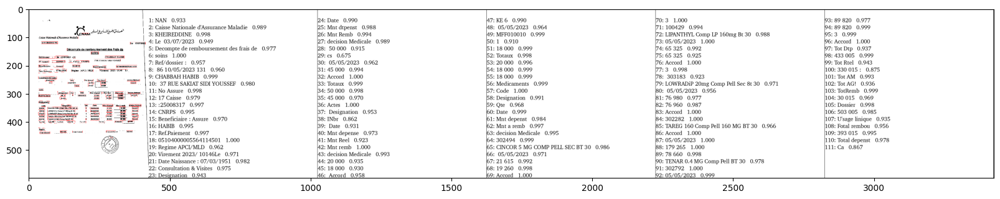

In [91]:
plt.figure(figsize=(20,20))
annotated = draw_ocr(img, boxes, texts, scores, font_path=font_path)
plt.imshow(annotated)



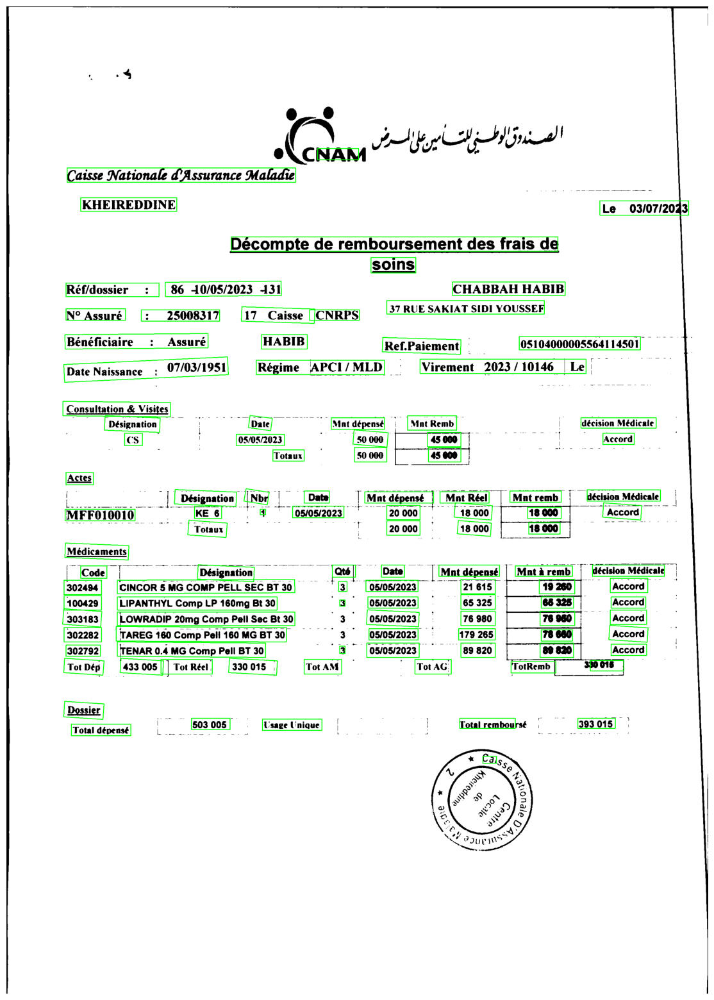

In [92]:
for box in boxes:
    # box est une liste de 4 points (coins du rectangle)
    box = np.array(box).astype(int)  # Convertir en entiers
    cv2.polylines(img, [box], isClosed=True, color=(0, 255, 0), thickness=2)  # Dessiner le rectangle

# Afficher l'image avec les rectangles
plt.figure(figsize=(20, 20))
plt.imshow(img)
plt.axis('off')  # Masquer les axes
plt.show()

<div style="padding: 10px;
            background-color: #f0f0f0;
            font-family: Arial, sans-serif;
            color: #333333;
            font-size: 120%;
            text-align: center;
            border-radius: 10px;
            box-shadow: 0 2px 8px rgba(0, 0, 0, 0.1);
            margin-top: 10px;
            opacity: 0.9;">
📄 Extract Text Automatically from Sample Data




</div>

In [104]:
def perform_ocr_and_visualize(path, ocr_model, font_path):
    """
    Function to perform OCR on an image, extract detected components, and visualize the results.

    Parameters:
    - img_path: Path to the input image file.
    - ocr_model: Initialized PaddleOCR model.
    - font_path: Path to the font file for visualization.
    """

    # Run the ocr method on the ocr model
    result = ocr_model.ocr(path)

    # Extract bounding boxes, texts, and scores from the nested structure
    boxes = [res[0] for outer in result for res in outer]  # Extract the bounding box coordinates
    texts = [res[1][0] for outer in result for res in outer]  #
    scores = [res[1][1] for outer in result for res in outer]  # Extract the confidence score (float)

    # Import the image
    img = cv2.imread(path)

    # Reorder the color channels
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Visualize the image and detections
    plt.figure(figsize=(20, 20))

    # Draw annotations on the image
    annotated = draw_ocr(img, boxes, texts, scores, font_path=font_path)

    # Show the annotated image using matplotlib
    plt.imshow(annotated)
    plt.axis('off')  # Hide the axes
    plt.show()

In [105]:
path='/content/drive/My Drive/image_numérique/pretraitee_2901--Mle 65023  BS 7059106--20231026_page_2.jpg'

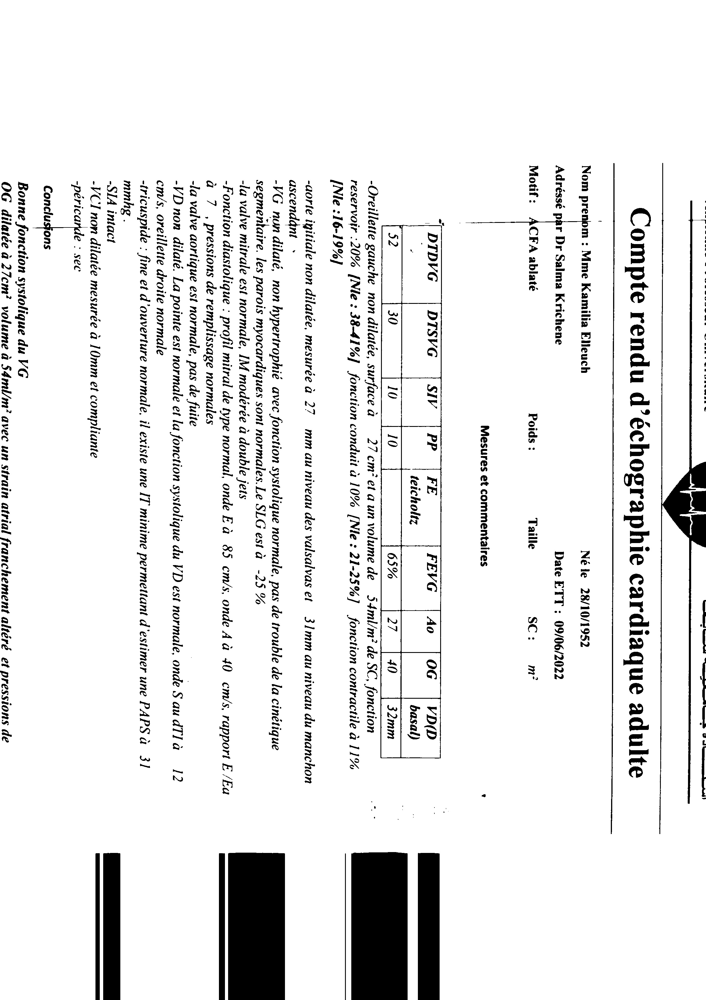

In [106]:
img = cv2.imread(path)

# Vérifier si l'image a été chargée correctement
if img is None:
    print("Erreur : Impossible de charger l'image. Vérifiez le chemin.")
else:
    # Afficher l'image
    cv2_imshow(img)

[2025/03/08 16:22:30] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2025/03/08 16:22:30] ppocr DEBUG: dt_boxes num : 57, elapsed : 0.25114893913269043
[2025/03/08 16:22:36] ppocr DEBUG: rec_res num  : 57, elapsed : 5.707947492599487


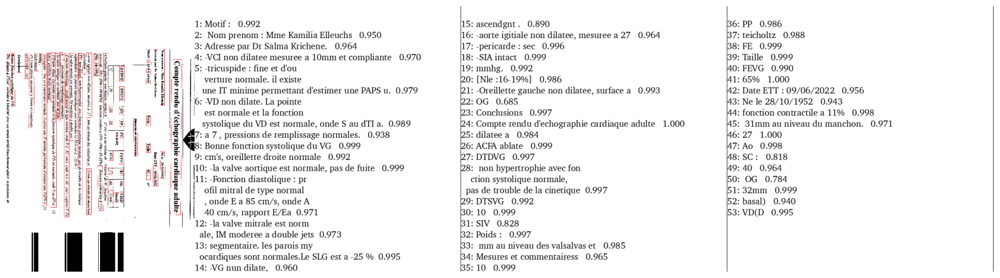

In [107]:
perform_ocr_and_visualize(path, ocr_model, font_path)


In [108]:
path='/content/drive/My Drive/image_numérique/pretraitee_5267--9523449--20230914_page_2.jpg'

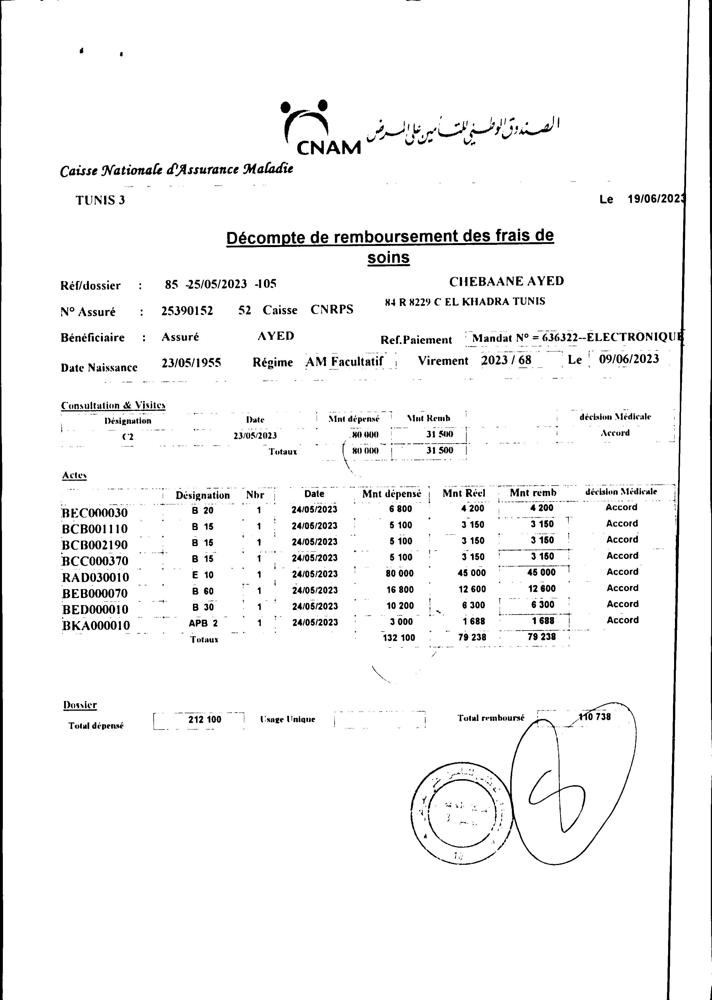

In [109]:
img = cv2.imread(path)

# Vérifier si l'image a été chargée correctement
if img is None:
    print("Erreur : Impossible de charger l'image. Vérifiez le chemin.")
else:
    # Afficher l'image
    cv2_imshow(img)

[2025/03/08 16:23:02] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2025/03/08 16:23:03] ppocr DEBUG: dt_boxes num : 117, elapsed : 0.3877694606781006
[2025/03/08 16:23:09] ppocr DEBUG: rec_res num  : 117, elapsed : 6.4855637550354


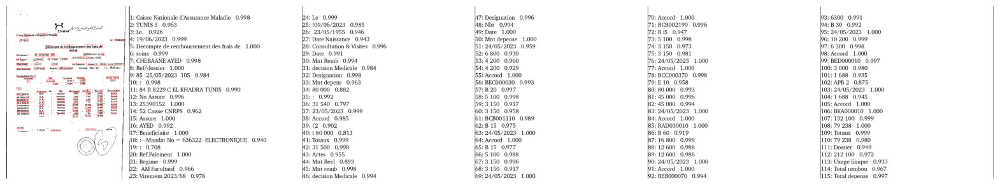

In [110]:
perform_ocr_and_visualize(path, ocr_model, font_path)
